In [1]:
import tensorflow as tf

# You'll generate plots of attention in order to see which parts of an image
# your model focuses on during captioning
import matplotlib.pyplot as plt

import collections
import random
import numpy as np
import os
import time
import json
from PIL import Image

In [2]:
# Download caption annotation files
annotation_folder = '/annotations/'
if not os.path.exists(os.path.abspath('.') + annotation_folder):
    annotation_zip = tf.keras.utils.get_file('captions.zip', cache_subdir=os.path.abspath('.'), origin='http://images.cocodataset.org/annotations/annotations_trainval2014.zip',extract=True)
    annotation_file = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'
    os.remove(annotation_zip)

# Download image files
image_folder = '/train2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
    image_zip = tf.keras.utils.get_file('train2014.zip', cache_subdir=os.path.abspath('.'), origin='http://images.cocodataset.org/zips/train2014.zip',extract=True)
    PATH = os.path.dirname(image_zip) + image_folder
    os.remove(image_zip)
else:
    PATH = os.path.abspath('.') + image_folder

13510573713/13510573713 [==============================] - 237s 0us/step


In [6]:
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

In [7]:
# Group all captions together having the same image ID.
image_path_to_caption = collections.defaultdict(list)
for val in annotations['annotations']:
    caption = f"<start> {val['caption']} <end>"
    image_path = PATH + 'COCO_train2014_' + '%012d.jpg' % (val['image_id'])
    image_path_to_caption[image_path].append(caption)

In [8]:
image_paths = list(image_path_to_caption.keys())
random.shuffle(image_paths)

# Select the first 6000 image_paths from the shuffled set.
# Approximately each image id has 5 captions associated with it, so that will
# lead to 30,000 examples.
train_image_paths = image_paths[:6000]
print(len(train_image_paths))

6000


In [9]:
train_captions = []
img_name_vector = []

for image_path in train_image_paths:
    caption_list = image_path_to_caption[image_path]
    train_captions.extend(caption_list)
    img_name_vector.extend([image_path] * len(caption_list))

<start> A close-up photo of a parking meter displaying the time. <end>


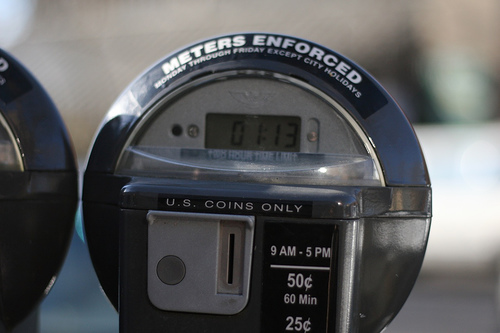

In [10]:
print(train_captions[0])
Image.open(img_name_vector[0])

In [11]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.keras.layers.Resizing(299, 299)(img)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

In [13]:
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

In [15]:
!pip install tqdm

In [16]:
from tqdm import tqdm

In [17]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.AUTOTUNE).batch(10)

for img, path in tqdm(image_dataset):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        np.save(path_of_feature, bf.numpy())

100%|██████████| 600/600 [17:10<00:00,  1.72s/it]


In [19]:
caption_dataset = tf.data.Dataset.from_tensor_slices(train_captions)

# We will override the default standardization of TextVectorization to preserve
# "<>" characters, so we preserve the tokens for the <start> and <end>.
def standardize(inputs):
    inputs = tf.strings.lower(inputs)
    return tf.strings.regex_replace(inputs, r"!\"#$%&\(\)\*\+.,-/:;=?@\[\\\]^_`{|}~", "")

# Max word count for a caption.
max_length = 50
# Use the top 5000 words for a vocabulary.
vocabulary_size = 5000
tokenizer = tf.keras.layers.TextVectorization(
    max_tokens=vocabulary_size,
    standardize=standardize,
    output_sequence_length=max_length)
# Learn the vocabulary from the caption data.
tokenizer.adapt(caption_dataset)

# Create the tokenized vectors
cap_vector = caption_dataset.map(lambda x: tokenizer(x))



In [20]:
# Create mappings for words to indices and indices to words.
word_to_index = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary())
index_to_word = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary(),
    invert=True)

In [22]:
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
    img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
    capt_len = len(img_to_cap_vector[imgt])
    img_name_train.extend([imgt] * capt_len)
    cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
    capv_len = len(img_to_cap_vector[imgv])
    img_name_val.extend([imgv] * capv_len)
    cap_val.extend(img_to_cap_vector[imgv])

len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(24012, 24012, 6004, 6004)

In [23]:
BATCH_SIZE = 50
BUFFER_SIZE = 500
embedding_dim = 256
units = 512
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [24]:
# Load the numpy files
def map_func(img_name, cap):
    img_tensor = np.load(img_name.decode('utf-8')+'.npy')
    return img_tensor, cap

In [25]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int64]),
          num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

In [26]:
class BahdanauAttention(tf.keras.Model):
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)

    def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
        hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
        attention_hidden_layer = (tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
        score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
        attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

In [27]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [46]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size):
        super(RNN_Decoder, self).__init__()
        self.units = units

        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.gru = tf.keras.layers.GRU(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        self.attention = BahdanauAttention(self.units)

    def call(self, x, features, hidden):
    # defining attention as a separate model
        context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
        x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
        output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
        x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
        x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
        x = self.fc2(x)

        return x, state, attention_weights

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [47]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size())

In [48]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')


def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    return tf.reduce_mean(loss_)

In [49]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
    ckpt.restore(ckpt_manager.latest_checkpoint)

In [50]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []
@tf.function
def train_step(img_tensor, target):
    loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
    hidden = decoder.reset_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([word_to_index('<start>')] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        features = encoder(img_tensor)

        for i in range(1, target.shape[1]):
          # passing the features through the decoder
            predictions, hidden, _ = decoder(dec_input, features, hidden)

            loss += loss_function(target[:, i], predictions)

          # using teacher forcing
            dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))

    trainable_variables = encoder.trainable_variables + decoder.trainable_variables

    gradients = tape.gradient(loss, trainable_variables)

    optimizer.apply_gradients(zip(gradients, trainable_variables))

    return loss, total_loss

In [52]:
EPOCHS = 5

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 1 Batch 0 Loss 0.9901
Epoch 1 Batch 100 Loss 0.8690
Epoch 1 Batch 200 Loss 0.7472
Epoch 1 Batch 300 Loss 0.8896
Epoch 1 Batch 400 Loss 0.9234
Epoch 1 Loss 0.842843
Time taken for 1 epoch 1409.24 sec

Epoch 2 Batch 0 Loss 0.8402
Epoch 2 Batch 100 Loss 0.8541
Epoch 2 Batch 200 Loss 0.7000
Epoch 2 Batch 300 Loss 0.7064
Epoch 2 Batch 400 Loss 0.7954
Epoch 2 Loss 0.730202
Time taken for 1 epoch 1360.77 sec

Epoch 3 Batch 0 Loss 0.6950
Epoch 3 Batch 100 Loss 0.6562
Epoch 3 Batch 200 Loss 0.6605
Epoch 3 Batch 300 Loss 0.6614
Epoch 3 Batch 400 Loss 0.6266
Epoch 3 Loss 0.672476
Time taken for 1 epoch 1396.94 sec

Epoch 4 Batch 0 Loss 0.7227
Epoch 4 Batch 100 Loss 0.6366
Epoch 4 Batch 200 Loss 0.6073
Epoch 4 Batch 300 Loss 0.5640
Epoch 4 Batch 400 Loss 0.6338
Epoch 4 Loss 0.628454
Time taken for 1 epoch 1387.46 sec

Epoch 5 Batch 0 Loss 0.6222
Epoch 5 Batch 100 Loss 0.5801
Epoch 5 Batch 200 Loss 0.6320
Epoch 5 Batch 300 Loss 0.6226
Epoch 5 Batch 400 Loss 0.5526
Epoch 5 Loss 0.591322
Time t

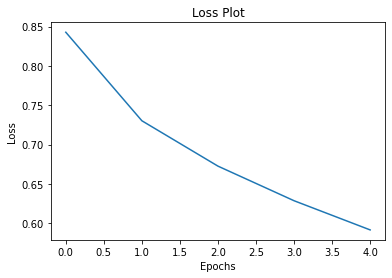

In [53]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

In [54]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0],
                                                 -1,
                                                 img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([word_to_index('<start>')], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input,
                                                         features,
                                                         hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        predicted_word = tf.compat.as_text(index_to_word(predicted_id).numpy())
        result.append(predicted_word)

        if predicted_word == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [55]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for i in range(len_result):
        temp_att = np.resize(attention_plot[i], (8, 8))
        grid_size = max(int(np.ceil(len_result/2)), 2)
        ax = fig.add_subplot(grid_size, grid_size, i+1)
        ax.set_title(result[i])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

Real Caption: <start> a skateboarder jumps over a flight of stairs with a crowd of kids watching. <end>
Prediction Caption: a garage mid air on a view of the pedestrian bridge. <end>


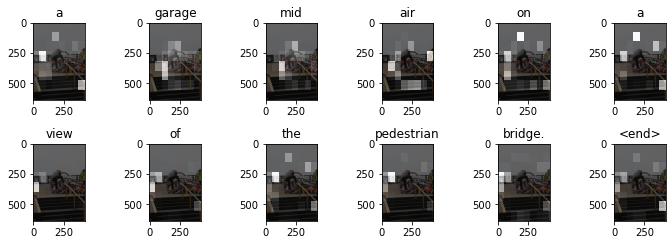

In [56]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tf.compat.as_text(index_to_word(i).numpy())
                         for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

64400/64400 [==============================] - 0s 1us/step
Prediction Caption: a man is riding along a wave. <end>


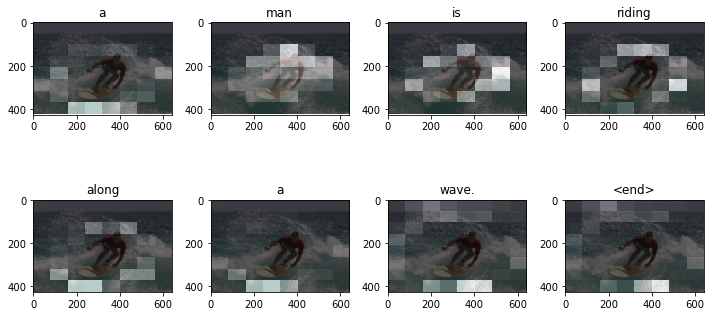

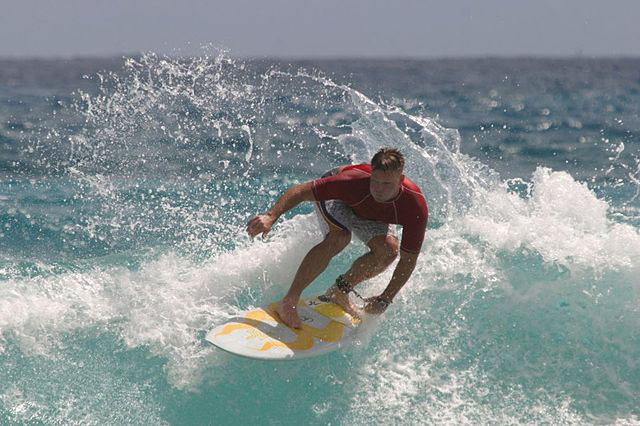

In [57]:
image_url = 'https://tensorflow.org/images/surf.jpg'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

32919/32919 [==============================] - 0s 0us/step
Prediction Caption: a man snowboarding down with wild cow. <end>


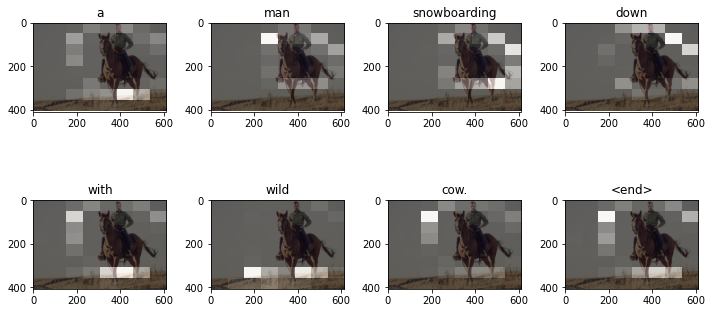

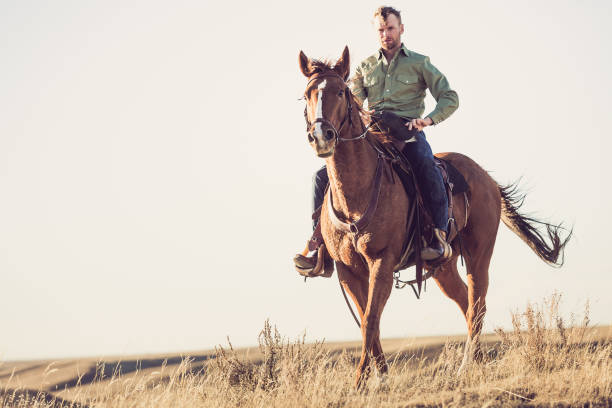

In [60]:
image_url = 'https://media.istockphoto.com/photos/cowboy-on-horseback-picture-id646175476?k=20&m=646175476&s=612x612&w=0&h=XZztatwc3e0yHOtXzAylAjvRuUQqtyP4y53Su42ALcU='
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

27288/27288 [==============================] - 0s 0us/step
Prediction Caption: a [UNK] dressed in a pink tie looking on a sidewalk as a fence. <end>


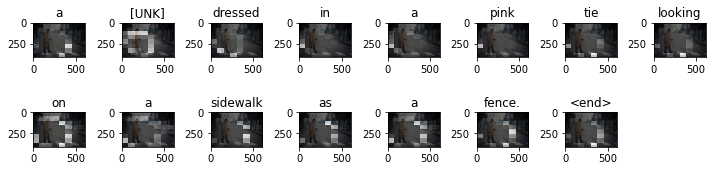

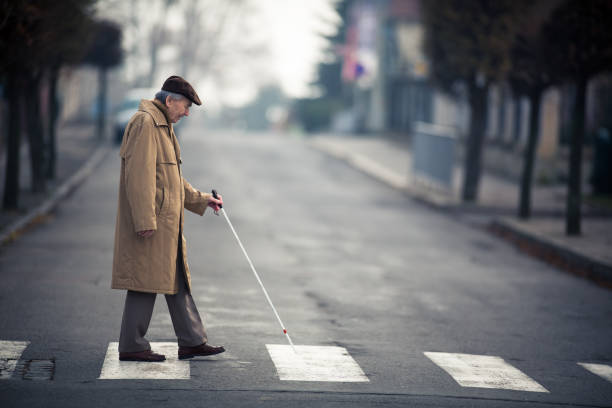

In [63]:
image_url = 'https://media.istockphoto.com/photos/blind-man-crossing-a-street-picture-id1292075242?k=20&m=1292075242&s=612x612&w=0&h=CeztC1Y2erLKVZrnI1JoUf7DfskR9D1bb8933ul023w='
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

Prediction Caption: man standing in the back of a street looking at their cell phone. <end>


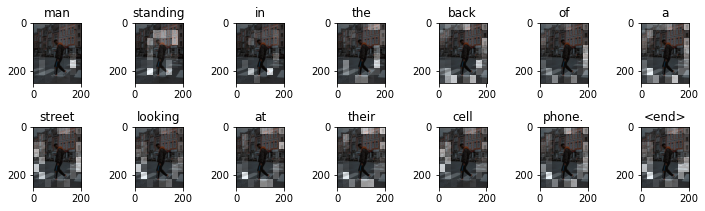

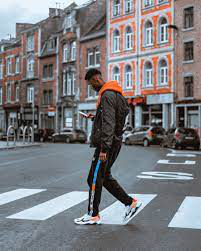

In [71]:
image_url = 'data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAoHCBUVFBcVFRUYGBcZGyEcGhoaGx0dIBscHSAaHBwcIxogICwjHBwoHRkaJDUkKC0vMjIyHCI4PTgxPCwxMi8BCwsLDw4PHRERHTEoIikyLzE0MS8xMTExMTExMzExMTExMTMxMTExMTExMTExMTExMTExMTExMTExMTExMTExMf/AABEIAPsAyQMBIgACEQEDEQH/xAAcAAACAwEBAQEAAAAAAAAAAAAEBQIDBgEABwj/xABIEAABAwIDBAYIAgYIBQUAAAABAgMRACEEEjEFQVFhBhMicYGRIzJSobHB0fAUQhVigpLh8SQzQ1Nyc7LSBxZUosI0RGOT4v/EABkBAAMBAQEAAAAAAAAAAAAAAAECAwAEBf/EACsRAAICAQMCBQUBAQEBAAAAAAABAhEhAxIxQVETImFxgQSRobHBMvBSQv/aAAwDAQACEQMRAD8A+szUFOUMHqiXKttI7gxC5qdBhU1ei1BoKZbXqh1oroWK1Gs7M6H+FVNKXHaIJygzlgSZ58tK+XbWbnFOqT2R1qidx9a9vO9ELxzjbzvVPKCQR+YlIB3RpA4DjQsO03e2NttsJP53IsgfFXsilfRvb7rpWHWzEkhaR2R+r3c71gkLdW5kSkkEHMu0GZvcSdNKp268poobbcXcdoZjHlQ9TV0PpO1ukiW5Ay2HtSonhlAMeY76xeN2g66sLKi2BoEkhRnWVXNxzPfSFhzMQDTFL8JCREDWRQcr4HjCssvLyQmLyLAg2plsZIU0rNftD3qFIH1mdRxp30YWFsKM26wePaFK+vsPH/S9yrG7HS4+nM4UQVKyhJJOUTySIAO+nmGhYVIB9IYt+rw8KFxGJSHQAMyk9bmCZOWRlEgbiTUsRi4QchTnzzEFVoiYTTuk18/oSNuEv+6ljCVOMsFcJJAJSAAJzkWSNLUzxUS3/mmP3TWewCFhtpu/ZypkkD802QJOp3032qD1YICjDxskkEgjiL0kmsv2Kwi6jH3Afx5DiiU5R1a25WQmVEqggesRUXH5S6AlSpQASDkge1Kr6zurzGznFEkJS3O/f53UaM/RSPWddKlG0AxPLiaSWpKVOK+Xgpp6EYXufKqllirDqCdCRJk5BJJ4la9T4CrV4VPULBSYLg9bUi0TTdaENJJS2CR4qHnehMfiOsYJ07aR7xS+ZySm85wl/R2oLTb04urSbb/gkDMWA8h9xUMS4hsS44lHeaLxIhJveD5x/H3185xLLeYqBUSCZmToeNMkiMpPob1hSVpCkEKSq4PHSrM45/fjVOwxmZb4ZdI3eNE5hwPmKNIybNsFVZ31QldWKX2T3H4V1nARY2vhzo80f2xRCNotKslxB7lD618rNhASkkmfVk1FDZAAUEp77k+FS3+hbw13PqWN2i20JcWEzoNSe4C5rKbT6YKKSGUhO4KUZVzIToPHyrM4RlLiwhIMqOXMTEHdAFVODq1qBg3I7ooOb6BjBdSraJUqc5UcxzK7Wp5nU1xjDgHsCM0CJNVYl3NoKIwuKS2UE+tNk7yTYUi5KP0NjgWQ2DlAHZgmBPqkmCdKyXSHCgOIWDYjTfOs91O0bUU26GA3cwFLUbCRcgb9d9B4VlTrjozDKibxff8ASqSyqJRw7EuHTBJIsKtS4N0T7qEacN0zvofFPEejRf2lcOQqVlqOY/FFZ6tGm8itf0PAGFUQYAVMxP5vjWRGGJAQgGPzKIueUa1uOip6vDrITMEADTU1nw2+wY/6SSvKL0MuLMhBVO9dgf2RAoxrZi4hSwkTOVIqK9sthxLSjlWoQDwVwoV3ELbbcWFEqkgE7hvqco+aKk27+DqjOoycUlXy2N04ZptSQQcxIiZ148KnjnyhslIBJdy8r0i2LtBx1tOcytKhuvB0FN9oN5snDrlT5W+FHMVKKxxVeomJOE5O+bv0FmK6TNtOBtehspXBRtqN1UuJyLWqJKAYO8m0GoL2Ay5nLjpByKXlSmVZUkkmTbdRiQjthJJlKdeHyOlbV07cb7i6GttjOuq/pktn7Vf/ABgAUpSc2VYuddTyj5Vq3UZWl7h1iR5fYriMc4W8UlBS31bzbaShIByqPaniTNZDH7OxaUrcRi1H0gGUzBO48tKOokpLOci6UpPTkksY/ZqMQr0auEb6xDjY6tJA1UoHn61aTZ2KW62A5lQqCCTpPfQqdmoyhK3QcqiQGklUzO8230yViSYx2KYabG+KPk+0fI/WgsFCU5UhQAFs2p74ovMfv+VKOjVoKSSM6QRrcSPCg17WabUttaySLA5T7CSZge0TWJxuJcSA4soT1naGa5VxO65oRW3SkR1YWSdIUAd17ya6XNHGoBLaM2aFESCbW0vHOqlYJS3CoQEpA53vu8Ko2binFLUpaD6qgJsBI0ArQ7MHozO8eYGa1RirlR0Txp31sr2PhMjzYJkzmM90+FZzGr9I6b+so+81qWCPxaRew+RrKvIJWtSoI6zIkHiTJPgPjQS5XqNN4T9ERKUJb6xzXWEm4HMbquGHCChSUBJKUuSrcDcT4VXtduEKQn8zSrDiSPrRO3mzlbSNQ22kjcTlAE8r0XwJHLLsTjWzK1nOtW/We6rtgY1HWOQkjMgyYi+6l7+x1oQkFQzEiSkRF4MeBrQbU2Q2yy0ltBQrIc5Myo+1NBRcfMM5bqiITswhMqcS2Dckm/cKHTiMG0YCi4ocBNcb2KFQpxalZuJo4YRlr2RzPKtuXQzg+oIdtumzLASOKhWo6PNrLBzntFac2781K0EGMoIETpHdatFsoHq7e0mf3qDk3afYpCCTUk+oNi9ituPZ1OZCjMsAIJsk3vpTJttBQoFIUnMskGbwkmDVr8aH+7dPvFQwzeVtUXuv/Sao154kIO9Kd/8AZB0YoZWihttAWhtZCRF1KM31IgDWi8co+jA065U+RoRhcN4cqFi01EC05jIHhReMdAyyQB1qpJMAQCPnU58yz2/ZbTS2xdf+v0VpSmHSf+nX5SqaW4ZEFd5GVB8/5UyQ+1C8y1HM2pshtBVAM3zaaGlAdyKchMiwAWQkhI0MCabWaUot9xPp1Jxml1X9LW19jGRlH9IbFhfXfzqGKCS2s2jrh5fc0eh54A9WG05iCrq27k8StViedDu4VSGTmBkuA3jjy360uo7kq9RtJbYS3Yuq+PQVYUWUSBBJIA032iiWWidE/fyqtMhJUDoSR74++VY7G7WxKipJfIA0ygJ/jWVdQStPBt8RIsSfj36VzKeJ8hQWyCSw2VEqkC+viTrRUf4vKgUjxkU4/FocLKSknq05QdARz30QhpUEhvKkRcCB5mh8MrIpsgXUlXrAW1IMbtBRO1S4GwhxZOZKib63MGBYWrO2m3+BYpRaUUuLyV4ZYV1hChIBHfa9XYTHuITlSlASU3UudbwMu811bbbRAbAGVsk2/PebEd1WbLwZfAWpWioJOgmbxxNhTwjUqQmpJyjufBfsttZdS44tGa4gb7GIA0EVn8YtCVySAEE62lRMqPy8KP2lhAXFNpXYAkKSSDYExWYGxk6rWVd5oOVWvU2xyp30GT+3WtCU8OymT50wedDrkgEDsZZ1gZbxSVnAtJsEie6tC9lQ4gqUEpCUEkmIAArbnL7oOxR+zGe21lTiUn2wBYABIXpYcq9tpNlW1KzPiRSzam28OXgtLnWIBzQhKjfMSBPjU17VTiMym0LSkA+uRJJJOg01p5SVMlpxe5fIPjwA2QZEJFUYjYwSW0KdbOZwDIDmUkayedEY0EpIVrF/dXFo/pp/zR8BSQXPuV1ZcexayhpICWlrXxUtOWTyvNaHY3ZbV/iBtff/AArLbOQIUDIOaQY3XrV7JeUElIbLlhbdbeayVya9A7tsIt9w5T6IzFpSpSpMqUEjKoybCTNDYVDwjKMokknLmPmqN3Ki+sxESG22xxMVT1Tjh7WIFtQjcO/SnauSbZOLSjJKLaOv4d1ZT1jnZSQe0oJiNeyBFVvOMLHacAhxRtf5aV04BpK0pUXFlehm3uqlDTSGwtptJKnVJGYcyPiKSWxJt57jxWo3FRVc1/Tn6QajIlLjkCN8V1C3DZvDhI4qgVFfSBlDnVE5VE5cwsJ4d01QnEKStRWtSurk8iRpbhSzmouKS5wPp6Upxk3Kqz7ha28RErcbbH33UHtHDkthzrCsJWNBAn4ml2A6RrceLTifRr7Ou/cP5Udn/o607kuj3/yoym1NR6NP7oWGknpuXVNfZgCljIe761gsTh05ibkkqtwsa3jaJB0Guthv1NJRsZJ9Z9pMKm0qO/cO+hGLNOSGWxF/0VqPYGtFZ1e0apwLYQgIQSoJsFREjjBojKeFCh4vBTtVfpmk2jJNgB+U1VtSOsj9dQ/7q9tN5IeSuQqEgJykRmjQ8r1TitoqXmJbbC5soTYzrzM76ZtZTfUnGMnTS6BG1DDi7flV8av2GodUiYs8CZMQBv50nVinXCQpalkjfy0HIa0w2VjGWkEOrCVXMa76aDTlfQXUTjBRfJS6v069PzacwYpBtRClOJAUUgAExvvTF/arK3VKQ4DMhIjlGulcXs9xagsJsQBO6lrP3G3LYvgB2LhJcURJUQdTzP8ACnPSBn0gbOpSkeMCoYPZym1KUogCIEHW/wDGqdtHrHkpMjttp11By3mjVfgCeMepW+w20Qg5c2fKoKuBpvpm1hkInq1JKSk+ruNDNbKCg8oJUSh43iTlCRrO6mOMZ6oApRGZsEHj2RMDvmmksCQlcgeWyn0hVlgerEz47qGxPTbDJclGHBIVOebk8Tx0pX0jxhThgEyC4oJ03XJtzAistgcKFkZjlBsOdTjLaiupDdJI+lt7eGMKVDIAkWCRBE8R4Vo9lK9EsSQSpIkd5+VfP9i4BtpxBTIzJIvMGd3eCPjX0PYpGQz7SfnWvdfsUUdtKuGLntuuJxSWsstK7JGhjSe+vbTUoMKKbSo6awN000U22FqUWkqUGy5mJOufLEVwL9GVCJHWESAbgEi1UcVvj8kYaj8KfuhP0bU8W0JcJJS4CCeB3TTjEsz1YEZQ6okeZqx3ELzNSZlLR03mZNuNRxJIU3GnWKnyNTlGNyXqisJSqL9JfozWK6NKdVnDjaY7XaVcAamNaaqQPSSZsm/33VNLYzuGR/6dY57/AHVUw3Bdm5hPlup9RLdHHUloSeyeen9Bmdn4VJW56VS2nEJOgGZZgEcQDRT6wWVxEB29QARkxNlf1zU6a5jHhXH28rKrz6b4Uur/AKjXqNoV4crfYXIHY4i8+elSLYtlFeYISJjST8aUP9KcoISyQAJk5b/GhFJrLDOVPCHaExUsh4DzofB4rrEIWU6jyn7+FFweI8qA0coy+EWiZUCrsqKdRcCR4Wr2JxKksHsJStSZnWO0Y+VX7Ry9eAkQOrFj/liqdrrJIB9mPAKMUaq/cTduavsCqwqglDbilaFW9Mg6UGcF28rbQUNCoyeelNcWol0gnjqd0m3dTLo0ClLq0kgpKojk2oi3hTRVuicnUbFaMJlBBSEneNPdVpxCwYCiE8BHxiaL2wtJdcKlSsxbwF6z+Pcc6xAQYTF599CWHSHi/Lb9B1hUyqVFRA4kmrdqwcUgDTO1r3ppXsNbmdedUi8DuNOdqIBxTcaBTZPhlmtFfw05Wl8huCcUW8aSo3U7POEJjyqOISZ3n0aP9CanhkpQ3igpaASXLZhfMlIEcdKKwyUKJcSoKAaAMbjkCcp52qzVqjni9rsSYlEtkHgKzG2MIcOrKqCJjszAPeR8txrVOtgDKSLRf313HbPQ+64hYsVkSNQPsmxrnUNy+TqnqOLXsZfZG0QVdUgE5jIGuU6kzuG+voOCdcSgCTO8gQSePL41h2MOMGhTgSVuLVlRmEADd4WJPGBwqXWuL7SsQ6Fb8pgeCY0rk1NLUnJxg6S/LPQ0tfS0oKWorb49Eb1vHqBhRMEFJKpVY/xApilEtkNiSesy5d5IMRXzBO2cU0rKFpdRBIz2JiBE8b762eytrdYyhYzAyZTmy5TOlrz9RR+mepoSrU4zT9exvqvC+phejzi1xgdvJU31PWBQlLSf2gDmHvqeIXCkD9dRJmAIBHzpXh8SHHEJUNFgyVqMeZ4xRG1Ma3lEKQs5yIHaiZm1da1FJSkuMfg4vBcJRg8On1xksbablRU6hOZpTcakSTe1BNOpzujNNgBlBMxobaUt/HuH+rKlD9VH8KpViHTJSh2VEBUQO6klrubTUXgeH0sYKUZTWVXJokdUErSG3VFxQWZt2k6RMWndS9tKi0vNI9MNdedBjZ+IP9kqeJWB86niFutMgONi7g7QXJ8orbpzknKLVWK46enFxjNNuvwUBByGNSD86w+JQsryqWYUSAAPy3rcMrBQFAm4PzrGY1MOIvvPxVTRJzNdsZv0TYF4GvECmObkP3qW7IEttkxpTGBy8hWCIMU2fxF7BKE5pMQMiRXMbhwo9YlxBQNTPMk28aRbZ65tQXBIVaXDJnzpYcU8eA7qZiJ8Z6UafHqbU5mbUSmLza5ufC9MNiYtpDbgW6huSrU+0hSRpzNZXY2dfWlS9ExxvO+ofhV2WVt6hURRTadiySao0+1VJL6hEmRfiIFLHhoZ9ofCo7VWvr0LDg7WUFA0jLapKbPBEzvSSfjQfNhWUkgzZhyuKiNT7yK70gcbcWpSXDmKoATI0EG47q84wmSpvOldrdXCR40vfWtGJWgJACUqItvAmfOtGV2GcNtFuGbBBQprQXIgkTvvTjZeMS031YQVZpm0a7xx3UtY2O+Ycz3UATCad9HyvrAVnMhEwkJk7idLk08U7IyaoqwiRqtpagBIFxJHOnLm2HVZcuFAgyDvnjYXq5fSrDJz+v2PW9Gq3uqA6WsmAlLpn9QinUYxWGK5ym8oyPTPaa3FICjC7kp4QEj4KPmaz7bpSVJJMajfbeRzBvHAmubQxCnX3XLECR2jcJBABAnWYFp1q0omD4gg3E6GoRTSydM5KTxxhfYg87JF5mR8JPiADRGB2q41ISvLoCYBlJ0MHeDaf5UrxKShwJ3G4jh9iKmlaZOYEg2t+Yai+4xHlRFNSrH4hx/Ih4lKUdoJyyTum3wpbjNoJEqDxLg0CVEXB0MUFg8KU4ljKpQS6QCdCQdZjjFO+lvRVtpGZoGdTeZvSeE3lt4Oh/U6cVSgrY+6IOZmM0zK1Xn606JQCJUkDvFfIdmsKhebrAlKSYlQB/jVv4lBTAbXpvBPvq8Z7Ukcc4bpOXc+yI2iyCVFxsA7yofWs/0q2i0vD+jcCoWCSg5uM6Uj6O4UKwEKT/aL1F6ZdH8IlOFAgQXU/wCmncnJUTUVF2JcP0gQ0jq0tqWU8rX1vQQ22JOXBoJm5IP0qnaPSfENrUkBoDUQ2NKZbU2hjOsSli4LaVGEJsSBUUq6/gu3fK/JBnbr9wlgxuSEkBPLSrv0xiP+nV5VHZT+0S831pWG83bskWvwpn+Ic/vF+dbZeTeI1gS9J2IaEkm83MxcU3wDuFbaCHE9tCQVdn2jAPvpd0gQFNK43P8A3pFGY/AZZzxLiEQnN2oBBkpFxx7qfh2T5VCVQR6JKSlOZToWEmCRJKc3yqGG2WwUAnWPaoZ3Zi3XHQhJyoJWVbh2UwJ76q/Qr3YSts5lguQACopImYGlpMUgw8cwqOsQQbhxtOv5cqd1UYzEuKUQXIUFq3DQaCuu7KUh5nE5k5FrSkJ/MMqY+VexbElRj+0PzosyGqOlrrieqLIRmATmzTECZFuVB7QSo4l2Iy5FzxmKDwLdweCh7wadrALr535FbqNuXItJcGj2bhnXcO2ptokcZAmLGxM0m2a4tLrgzQAlRAFiDGsjfWl6P7RbRhW0qf6shJlJCbeaZpBsskrdAUO0gW9q1O80IlV2Uv7VcUFF9pL6JydYIS4DeJMQ4mcohXE3tSrE7YdYPpEwtclDZQIQgA/2gUJiOFzTHEpHUgAgkvDQ8xXv+IuTq2zlTnMjNAkJlMidYvSuPW+Ci1P/AJpZPnuHX2jO5JvzIlR79fdTdoEJBBBGsxHnxB93hSthELA/xTeNQRr40xwwKNAC3wNyOc/KkHANoL9IkgbvfJnuNFdHtmDE4hDUlKSSVHUhKQSqPAxQ+18ocSJJtfx+Nqb9DSptTrqbFLakJWR2Uld8xjgExG8qFZcgfAc6tP4rBhKQElVhewBMR4VpumqihmUGCCII7zWWUJxOCOdLmVeVakaZrk21HdWq6YtoW31ba0zI9Yxxmqr/ACyUv9IwOxsa66taVuKI6tUcja+lcxmDxiT2VOqEA87/ACppsTZriAQgtLXlMJSoEkzOm8VdiOlOMSpxJ6sLUAAYSMuXdFTruUbfQadGes/BJ6zNm6xz1taP2KqMOf8ANT/pNDbEfccwgU6rM4XHCdN991RwuISjDpRN1uSTplCQR76p2J9/cw+0tnOOuLyR2UAmSBbteelajENrDjWRwoltsGIMyDx7qyO3m1Fw9g6a3vy4fzrZNArcbKbwGhE7wFTU0UkH4XCuBxJLy1AG4MQfdUeqo1KoXBBEEX3X50Hm51SiWRAgQpDC3EKzLSCZ/XST8KJ27jOszJCVhw51BeWwgEjt7twivM7AxrbgWpaC2FZlARpadROg41NOwHkkLXdMK/OoyVAhNjzIpKdVRS13ANk9YksZbpcs7cXQoQZBN/4UUy845jHHEZgUvAibDIm0AnUQndVg6PKzNKWj+qiDPsmZqC9jkSerJK3ErF5sFFRIvzrUzWhLtvFoQ44kFQWFWO4WGnC1AHGKU2uVKjN2JN533HKj9tbFfcdccS2SlRsfADShsdsdwqSG2lJTlEzvVvpWh4uizo+HHF9m6U9pZUoBKRznfWmRjW0OuH8Q0CUiFXXMzaw1FZdeHfiVtkkQBlTG/fGtqqcwrhv1KhWToDVm0w20VhQX+kUqTNx1JIPKaW7Z65LgcaejPw3zwEUjCOrbzZF9ZmgiD6v0qbm0H1hMNmEaXg1nJmSXUe4DEuSGnki6gpKtO1v3Vb/xHUc7Te/IFQN2Y7/AA0h2Xj3HHmwsEBKgSVkxAIkX31Ppji0rxK1pVIUZHLSB5Cm3eUXb5kxYtwDLYWBFrSL6neb/AAoth5KkkhYSBcjeOP2KWIdBMkZrfTSN9M8M1mGdLcItBkG/E75HDvpBxZtBR6zNEA6W+vf8K1nRXZzjjEOdYGFLORLQErct2lWmBAA3eVZVjGXVKc0qKpmCCd4O7urU4Xaqm8Ilpt5aHVrJJgjKnQQs2JhI53po11BK6wM8T0f/AAqwlC0pzkFS3FglESYyp3knWq8cwy4PSYlRgEBLbcDzJ99Kk40Edo5lCxMi58apW+YJSkTeCVjXdatuQNrNDhsG2yytTXWBxSCA6sDMBwFYFOFcJ7ICyd8g79a0b203cIOqdX1oWnMJF0k2IHK9ZpnaK0KKkHL3cPGkae707FFJbUks9+472TiXWkrXlUTGUpgxewVbhxqWDwBcfbDrkNBQK4VdSZlQjcItUcHjnVg5pJPKLcDxqIeWhQ6vUSSYJtw7zNGxaDNvrLr63G8qmzojTKNwHhWdSy5KrlGW/racBr76b4/aLZRKVQSSIGnf40G3tkBIT1TSgBElFz3mbmt7jOr8vA06MbScU4htxZIm2Yzxge+tBFfP0YwBwOQEwbBNgLzX0HrEeyf3jRiZy4DntrLWI6mAbGVHTwF6FViX1QC2kJHNSjbyvRBcPKqyo+1Vmcy9jy38QRGcDvSDVK23Tq6Y5AD4CrYJ3k1IMnf76FBsFOEJ1cV+8TV7bRAifdU8kb/KpADnWpGtnko51MJrwPIV0LNYBIN1IINcChU8xpgHuqG8DyrPbb6Ptr6x1bikiM0BIOUJGg04U/KqVdJFK/DOBEaSonQIBBV/LvpZVQY3Z84ZVGcjSN+tyI8an+KISbQFcDF+NveKddHGwG1FTaFBxQHaO5OUaRxUaB22ElwZEhCSEwE6CEjNr+sVVDd5qOpx8ilYvbEc7aczYe8ivo+H2Ujqm23EhRSkST7UXPnWS6KYDrXQsjsoVnPePUT5mf2a+gEVWKITl0FH6Aw94bAnWhHejLB0THMWNaEio5DTbULuYgxeyAtYWuVECBMER3RFDL2Oj2E/uitPkqh5E6UrgMpszOI2WeyEuKSBy1vN7zRI2I8tDhaSh0lMHKpSSmd+U/WmqEZVArQVJBuLieU7qajbjKQQnChBPsuKHuGtBRXULk+h82d6OYgJHoV5puZERUUbFcA7bDpPFOWPKvoatrI9hf75+tTRtZiO027O6HKO1dzb32PmC9luBQ9E5lkap3b61n6T/wDid8qbY7aEkdUpxI3hZSr5UN+kHf7z/tT9KWl3Db7DYFI3KPurvWcEge+qMxNeqtkqLlOHj5VAmqlud/hXAvhWs1Fs16qs5r0mgEuBqQNDirUg8BWMXJqYFQQk8KuCeJ8qYVnorE9PMR20NgmyZUAdcxtPH1K2+YcK+dPr/E44iZBcAH+FsK9xCffQatqK6hT2pt8JWQ22otNsMgDMlGZR1MqMkd0hVqWrKlFIEqWqe8lUADyFX7fdK3nCTMLKf3ez8QT41PYTkYptRgAKEkmIAtNLrNPUdccfYOgpLSV88v5N7sXZicO0lsXUe0s8VnXwGg5CjjVoaiSd1cInSmoWylSKkhNTyRVrDGYjOShPtZFK9wogB11HD40srCwlKlDQKEgc++nCNnYc/wDuwO9BT/qNVO9HmlXRiOsP6pa+bgrDKupA9MnN7SD3Ej60kdfaUSVNrk3PpfqimyujJG909zaFf6XTQy9iRqp0d7C//FRpfMFOIt6xmf6tz/7B/spy10gYShKPwiSEiBJSSeZOW5ob9AJKZGIaE7lhSD5KEih17Bd/Itpz/A6n4EihlB8rKdr41DqgUNJaAEQmLmdTAFAV1YIJB1FepRkMZNcqaWhx+/OjsNsd1z1GlkcT2R5mBTiWL4JqKMObfOtM10Rci7iU8pJ+UVJXRR3c42f3h/40aBZnA348amlun/8Ayq97SD+0f9tLcbs5TU5nWpH5QqT3QBWo1gwQBY/f0qQIGnmfpQuY7iPvxrwWrlWs1BebjUSqqMx4fflRKcM5E9WuP8JomopxK1BtZTdQSrL3gGPfXz3oskdZ1hBIQhSrcbD4FVfS8ih+VQ/ZNY1poNDaCmwQkApHIkLzDwM+ApHqeE1OrprA0dLxU4N1aeWZgkLlSt8qPfqapYeKVZgAe/nTHo9hEuvobXdBzZotbKrfuvFR27sZeGXB7TavUXx5HgocPHunnkpjg1/Rrb5eV1bkBUdlUzmjcbAT9K0hPCvj+GxBQQRqNDMQeNfRNh7XD6LwHE+sOI3KHzqkJdGTnDqhutcXNWo6QPoACHFQOMK8BIpe+ueNDqIpmxUh2OlWJ9pJ/ZHyAoI7VzHtMME/5cH3EUurpNqWxqQf+kOGHaHcFD4OV1G3nEiQ2kdy3fgHKVqVUQa1m2o0CemLgEFtHjn+JJqrE9Jc4hWGZVO9SZpJnOlVqUa25m2om64FKJCUpk6JmByAJNqjAqNek/YpRz67h8I23/VtpHOJP7xvRUk1k8X0s3Ntgc1/7R9aT4rabzs51qI3gWT5C3nVbRGmbbFbXZb9ZwE+yntH3aeMUkxXS06NNxzWf/EfWsuJqaGyYgeVCw0FYva7zk53FR7I7I8hrS8Dvp5g+jbrkFSQhPFWv7uvnFPsF0bZRdUuH9b1f3R85rUC0Y/C7PcdMNoKucW8Tp760GC6K6F1cfqo/wBx+Q8a1CUgCAABuA3eFSCaNGsFwWzmmvUbA/WiT+8b0ZmqDiwkFSiEgakmAPGkWP6SoTIaTnPtGyfLU+6sAeOrgFSjAGpJgDxr4ftJ+MNj1jRzErAN9OsTMbrhah+zzrZ4nGOOKlxWbgNw8NK+fbZJOAQsLGRzErUEDUGXbnkRljupZDwRzoO36dSvZbPvKfkDWzxWHS6gocSFJOoPuIO48xWd6EYQBtbpPrwnwTc+8x+zWwwGz3HSQ2OzN1mQkeO/uFaKwaXJ8x2/0fXhlZgczRNlb08Aobjz0NAYDGraWlaDcc9RvB5Gv0JhNitNpKVJDiliFKWAZB1ASbBPLzr5x0u/4dlCg5gwSFrgtKIhuZMhRPqSNDpOtBwfKDGaeGPui22sBjD1amQ26I7JUuFaSUqkb9xv31pl9HsMdG47lK+aq+e9Eejhw/WKxABWo5UoBMAIJJVI4nTl32+k4DHtuBKWihaEjtrQZSCBASCDEz5Ac6EJNyaa4G1IRjCLTdu/sDDo1h/YV++frWU24jDJVkYSSQe0vNI7hx76ZdIdv55aaPY0Usfm4gfq89/drmSR9/Snk10JxT6kCn7FcWipg16KQoUZedaTCdD3VoSsuJSSJylJkTpN9YqPRfZYdczqHYbgmdCr8o7t57hxrfKtTxjfJOU64MK50Md3ON+OYfI1D/kx722vNX+ytwVVyT9/zo7EDxGfN8ihwHl8qOwWzXXfUQSOJEDzNqqbfyHMmLcQkjyMg0cOlOIAspNuKAPhFDAcjjBdGQLuL/ZR8yfp408wuFbb9RCU84v561kmulT+8Nn9hQ+dXjpO5vbQfMfWjaA0zWlyuFc1lf8AmmP7IHuV/CvPdKFZew0Eq4qOaPCBWtApmpcdSgZlqCRxNqQ4/pQBKWk5v1lWHlqfdWWxOKcdOZxZUdxO7kBoPCh4oWMkMcVjFumXFKVwmIHcnQa0LMaedUpVa1PNi4ZhxAmXHQrtN50JhO4wVpMcwT3UDUL8HhHHJyJnKJVwFvuwrA7ZwyWMGw0oLDhWpRC7QkZgUkcipPiFcq+yJffa6wFhtDQjqyHW0oA3ypQzFc6kiIAibmgdqrYU2l99zBkDRRKXCDwQtQv4AaUJYjdWPpq5U3SEP/DLYyF4ULdJIC1EI0sYIJVvB1gV9FSQAAmABYACAO4UnwKGkDrErbPWhKgAoQQnRXDlbgKPCyf5zTaae3PIurW57XaLVKvagNrY1DLYccsCpKJ4ZyADpxijQvkaW7RQCtKyUpCO1mUbAwRMcQCbc+IFOSMvilPn0DaR1mJSVKJkfh8PEBTh1zE51ZbXMTaasxWPQ22nC4bstIGUqFivj3JPv7qp2rtQOKWG7JUZWo+s6RYFX6oAEJ0FLAZ5ffhU2yqR5ZryCAdAe/6V5afv7NeigE5FWMMKWtKECVKIAH392NQTzE+P8K1/RDZcJ69YuoQifZ3q8dBynjRSsDdDvZGzeobDeYGLkxEk6n4eVEqVU1LqlYqiJtnCa5XMs1771NEU+bZCbgG3OPlXUIIvB7z93okJ9oyeUWqwi0canRWyhpY1sedvjVpc/lv+lTRAFgO8iPGoqd3C5jWxjwm9ExBLW8gZd2mtecG/d986jiXgAAKHQDvPhvpQlilDcORrilVxSvd3VArmLW+/KsYnmiupDZPbRmO61QVp9i1VqQQJO/db4VgnsU2yv10TwzAH40tcwjP92gc4FFZptp7h7r1EWm8eFK8jLBW0EhWbKJjXfRgxB4+VCLcvMyeN7VErJ1k0LNQe7ijuWfA0JiXFOCFLURwKjB8NKqSd1WAVrs1UBpSUm0++jWHj3GvZZ3VMIFZILZcFzvrgXXAIry91EB0ufZp+z0sfAA6tqANwUIG781Z4Aa1LwopsVpM0w6YL3tpPcSPrUh0v4teS/wD81llDfVaqO5g2I2Celze9tfgU/UVP/m5r2HPJP+6sWTXo5Dzrb2bw0OUEGQkZfvma7nnsz8yKrOscTU3UAEQI/nTAOPad9vsULmgQka7/ALsK89YgVJnTvPypQnAiI/jFcnSR5/wqSdfL5V5Wv3zrGIgcZFeUgki1uNRWfnVzd/L51glamyOBjSTJodSyfCrn9/fQmJtpa3yoMKOlXfxjnVS1GrEfM1BOp8aUJAn77qiRXFesO6rE6eP0oBIAVYPfXjp4/SujU/e4UTHp3VYj7+5qFTXqfCiAnMWruWb/AH51BG6iDvomK4+7WrxiupG/n9Kj/GsA4pXCoE1Je+qzqe6gE4TXMw+wPpXhUsg4UDH/2Q=='
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

151429/151429 [==============================] - 0s 0us/step
Prediction Caption: a dog is playing in shark mirror. <end>


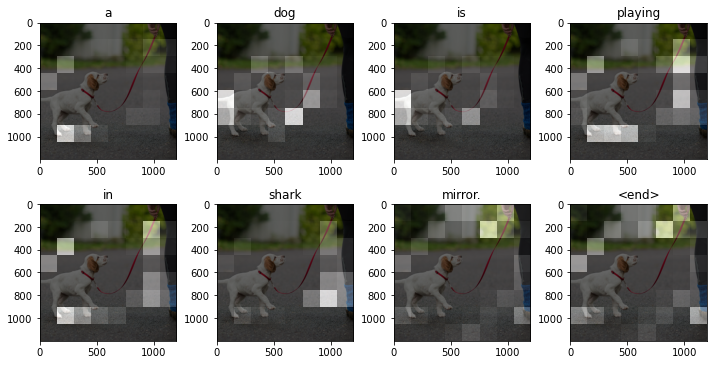

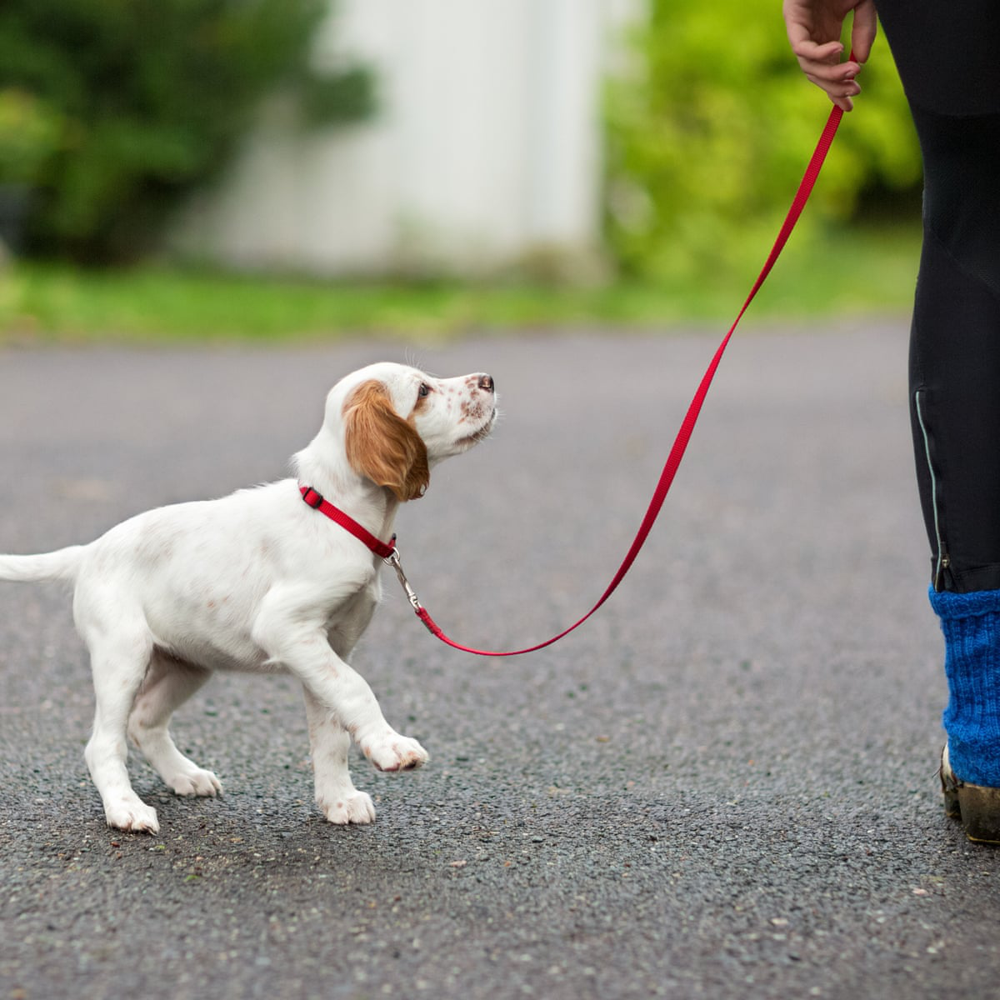

In [81]:
image_url = 'https://i.guim.co.uk/img/media/73658dd39bf0d9cbee60add383acd3edccef4955/0_318_5340_3205/master/5340.jpg?width=1200&height=1200&quality=85&auto=format&fit=crop&s=28481a15a5a72f76fa029fc867771958'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

139376/139376 [==============================] - 0s 0us/step
Prediction Caption: a man are playing tennis ball. <end>


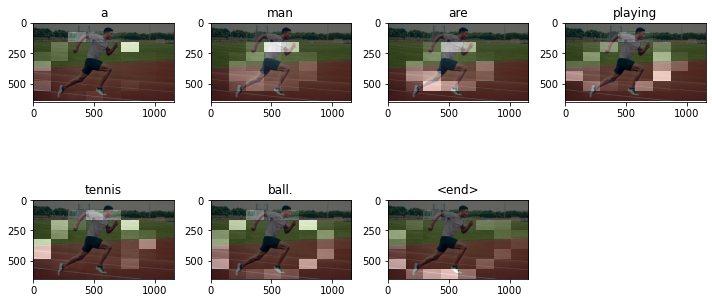

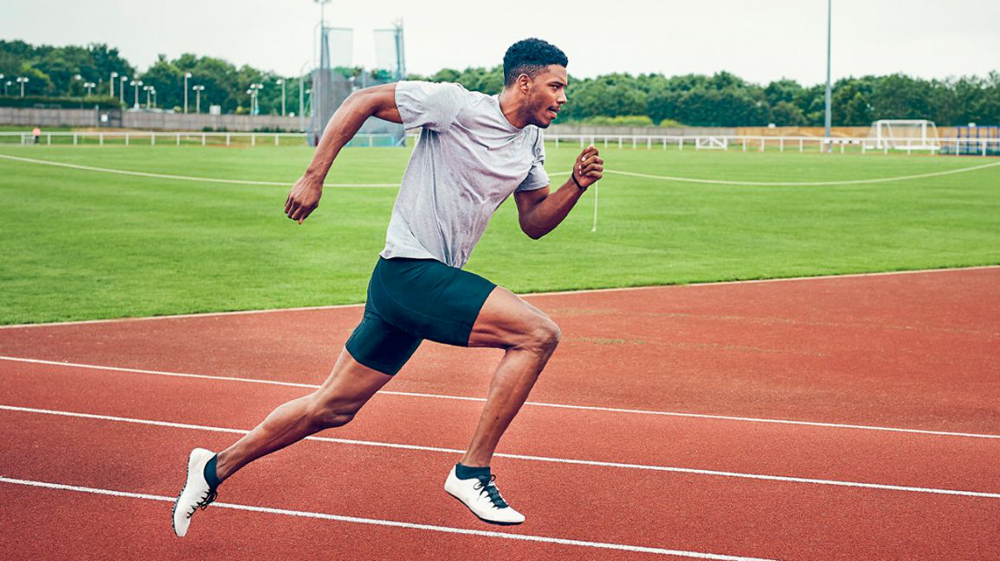

In [86]:
image_url = 'https://i0.wp.com/post.healthline.com/wp-content/uploads/2020/01/Runner-training-on-running-track-1296x728-header-1296x728.jpg?w=1155&h=1528'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

109748/109748 [==============================] - 0s 0us/step
Prediction Caption: a man in black and a boy with a bunch of a game on to a building and a picture in a city <end>


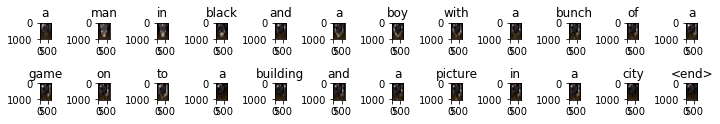

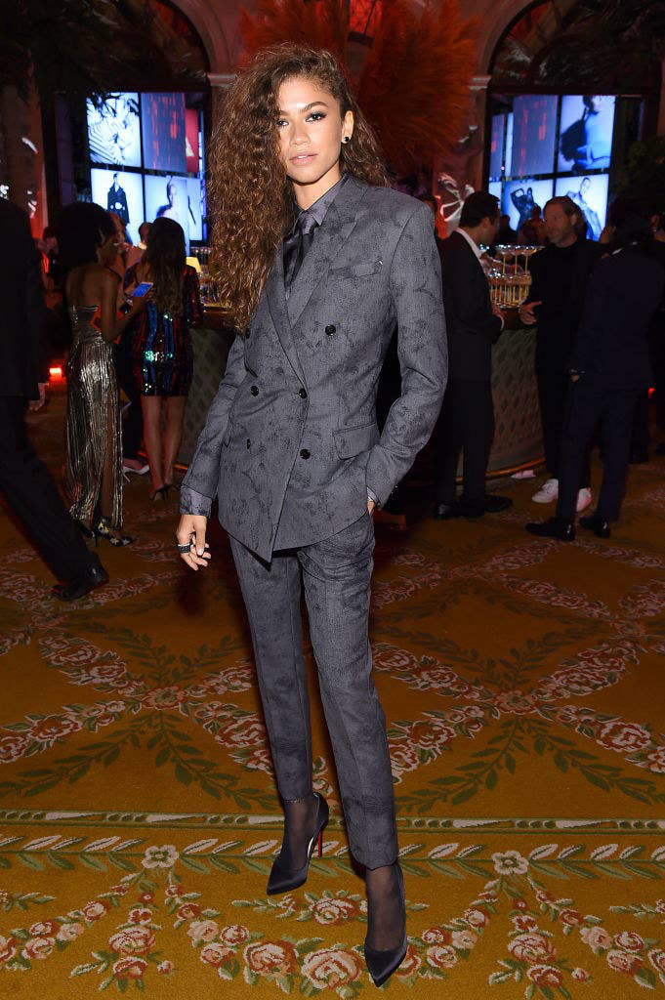

In [98]:
image_url = 'https://img.buzzfeed.com/buzzfeed-static/static/2021-01/28/20/asset/8fa52cb1b302/sub-buzz-1573-1611867461-61.jpg?downsize=700%3A%2A&output-quality=auto&output-format=auto'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

5546/5546 [==============================] - 0s 0s/step
Prediction Caption: a building is in front of a tall room. <end>


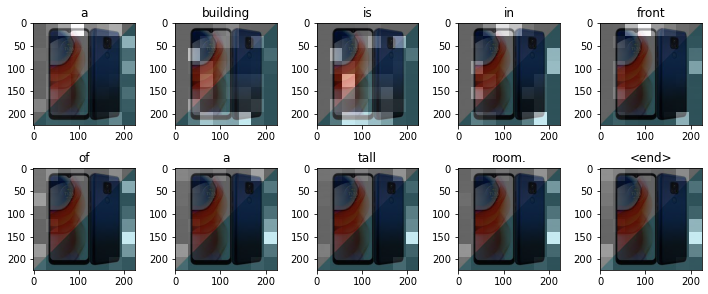

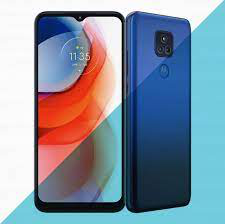

In [107]:
image_url = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQM0FGH7R1-vf6S2C9qyiCvZI6WVkdcttMRLVNCuyX1azGxid66bo2xRqZcEq_YmZfxyj4&usqp=CAU'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

462034/462034 [==============================] - 0s 0us/step
Prediction Caption: a whit raised airplane in a runway <end>


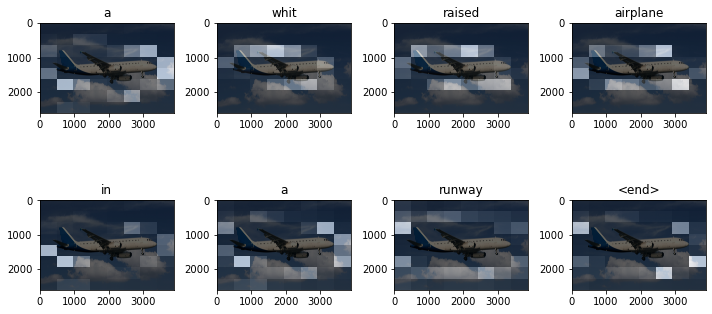

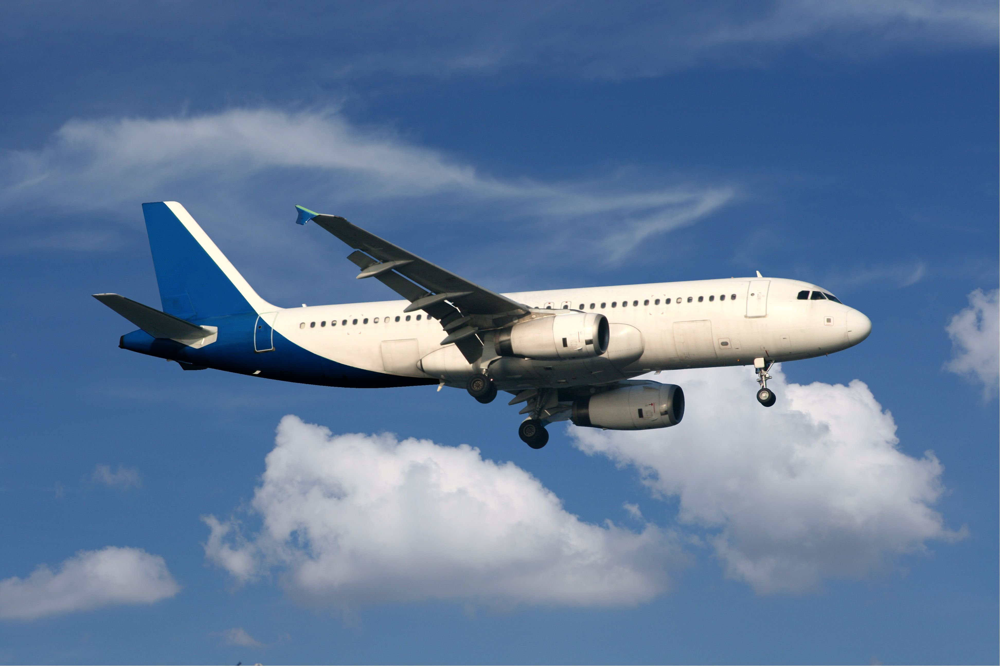

In [125]:
image_url = 'https://th.bing.com/th/id/R.cddb836e9d6183105e8c3ff290d332d7?rik=BEhMlf%2fC7x0ZNQ&pid=ImgRaw&r=0'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

#### References: 
1. Official Site of Tensorflow. 
2. Kaggle official site.